In [2]:
from pathlib import Path

import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import ROOT

# Set True only when a complete LaTeX installation is available.
USE_TEX = False
mpl.rcParams["text.usetex"] = USE_TEX

# High-resolution, publication-style defaults.  The plotting layouts below are
# intentionally retained, including the amplitude-scaling block.
plt.rcParams.update({
    "font.family": "serif",
    "mathtext.fontset": "stix",
    "font.size": 22,
    "axes.titlesize": 28,
    "axes.labelsize": 26,
    "xtick.labelsize": 20,
    "ytick.labelsize": 20,
    "legend.fontsize": 20,
    "lines.linewidth": 2.2,
    "axes.linewidth": 1.8,
    "xtick.major.width": 1.6,
    "ytick.major.width": 1.6,
    "xtick.major.size": 8,
    "ytick.major.size": 8,
    "xtick.minor.width": 1.2,
    "ytick.minor.width": 1.2,
    "xtick.minor.size": 4,
    "ytick.minor.size": 4,
    "savefig.dpi": 300,
})

COLORS = mpl.colormaps["tab10"].colors


def apply_poster_axis_style(ax, labelsize=20):
    """Apply clean inward ticks and unobtrusive scientific-plot styling."""
    ax.minorticks_on()
    ax.tick_params(
        axis="both", which="major", direction="in", top=True, right=True,
        labelsize=labelsize, width=1.6, length=7, pad=6,
    )
    ax.tick_params(
        axis="both", which="minor", direction="in", top=True, right=True,
        width=1.1, length=4,
    )
    for spine in ax.spines.values():
        spine.set_linewidth(1.6)


In [3]:
# Only limited to spin-1 so can have it be a bit hardcodey
# Changing from root branch name to wave format
# i.e. a_T_1_0 = P^+_{T0}
def ToWave(x):
   tmp = x.split('_')
   refl = "+"
   pol = tmp[1]
   wave = "S"
   m = "0"

   if (tmp[0] == 'b'):
       refl = "-"
   if (tmp[2] == '1'):
       wave = "P"
   if (tmp[3] == '1'):
       m = "1"
   elif (tmp[3] == 'm1'):
       m = "-1"

   return wave+"$^"+refl+"_{\\mathrm{" +pol + "}" + m + "}$"

In [4]:
def circular_mean(phi):
    return np.angle(np.mean(np.exp(1j * phi)))

def circular_std(phi):
    R = np.abs(np.mean(np.exp(1j * phi)))
    return np.sqrt(-2 * np.log(R))

In [5]:
# Shared wave and channel configuration.
cols_mag = [
    "a_T_1_1", "a_T_1_0", "a_T_1_m1", "a_T_0_0",
    "b_T_1_1", "b_T_1_0", "b_T_1_m1", "b_T_0_0",
    "a_L_1_1", "a_L_1_0", "a_L_1_m1", "a_L_0_0",
    "b_L_1_1", "b_L_1_0", "b_L_1_m1", "b_L_0_0",
]

cols_phase = [
    "aphi_T_1_1", "aphi_T_1_0", "aphi_T_1_m1", "aphi_T_0_0",
    "bphi_T_1_1", "bphi_T_1_0", "bphi_T_1_m1", "bphi_T_0_0",
    "aphi_L_1_1", "aphi_L_1_0", "aphi_L_1_m1", "aphi_L_0_0",
    "bphi_L_1_1", "bphi_L_1_0", "bphi_L_1_m1", "bphi_L_0_0",
]

OUTPUT_DIR = Path(
    "~/Desktop/PhD/Electroproduction/Electroproduction-Moments-Inverter/OutputFiles"
).expanduser()
FIGURE_DIR = Path("outputs/experimental_analysis_bootstrap")
FIGURE_DIR.mkdir(parents=True, exist_ok=True)

Q2_hermes = np.array([0.82, 1.19, 1.66, 3.06])
Q2_murho = np.array([1.14, 1.60, 2.80, 6.02])
Q2_eomega = np.array([1.28, 2.00, 4.00])
Q2_muomega = np.array([1.16, 1.64, 3.58])

# HERMES full-RICH phi sample: <Q^2> = 1.95 GeV^2 and <W^2> = 21.89 GeV^2.
Q2_ephi = np.array([1.2,1.7,4.5])

Q2 = [Q2_hermes, Q2_murho, Q2_eomega, Q2_muomega, Q2_ephi]
W = np.array([4.8, 9.9, 4.8, 7.6, np.sqrt(21.89)])
reaction = ["e_rho", "mu_rho", "e_omega", "mu_omega", "e_phi"]
filenames = ["ElRho", "MuRho", "ElOmega", "MuOmega", "ElPhi"]
bin_size = [len(values) for values in Q2]
channel_titles = [
    r"$e^-\rho^0$",
    r"$\mu^-\rho^0$",
    r"$e^-\omega$",
    r"$\mu^-\omega$",
    r"$e^-\phi$",
]


def output_file(prefix, analysis, bin_index):
    return OUTPUT_DIR / f"{prefix}_{analysis}_{bin_index}.root"


1000


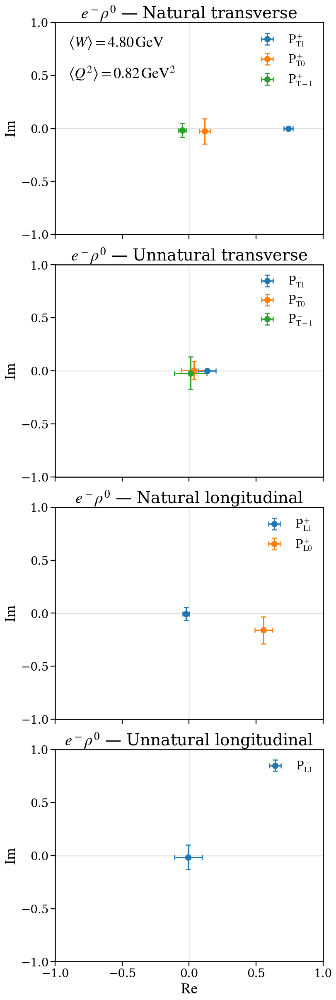

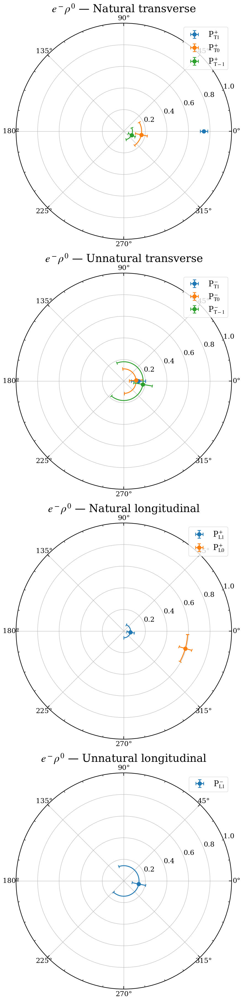

1000


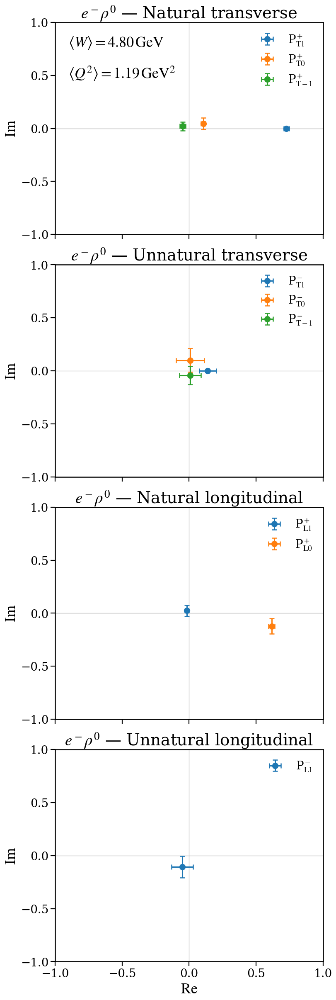

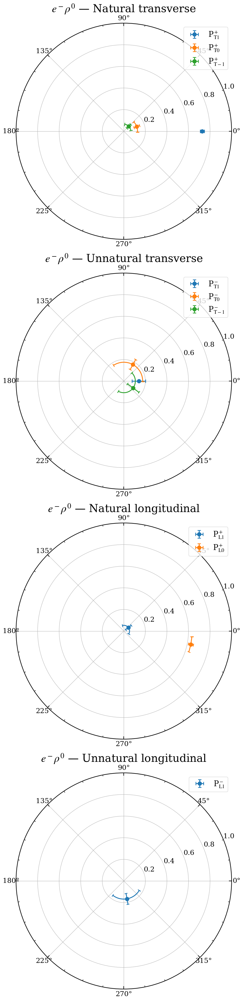

1000


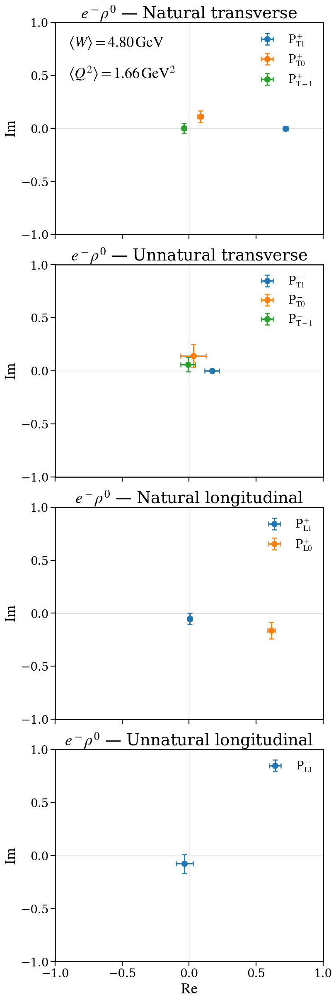

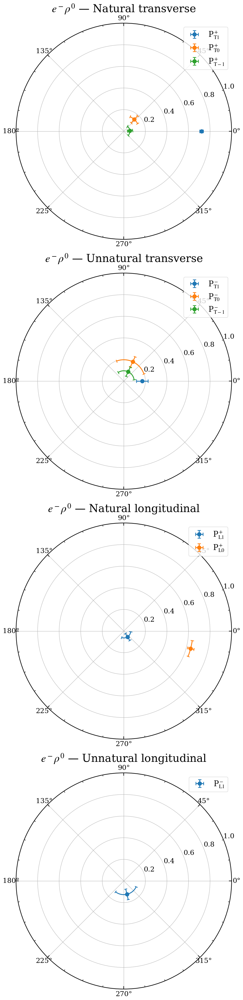

1000


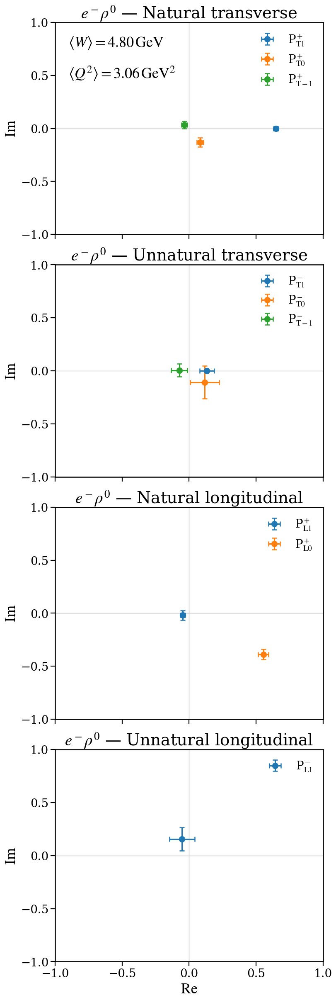

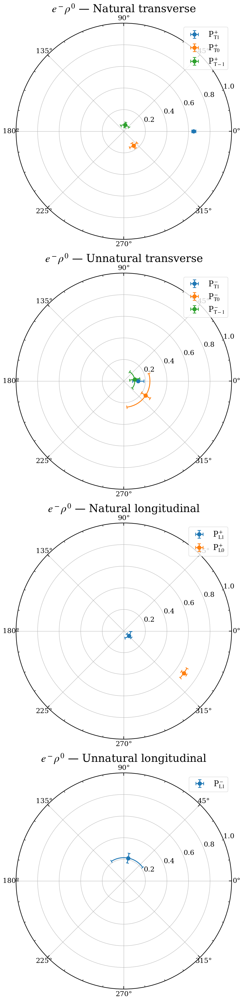

1000


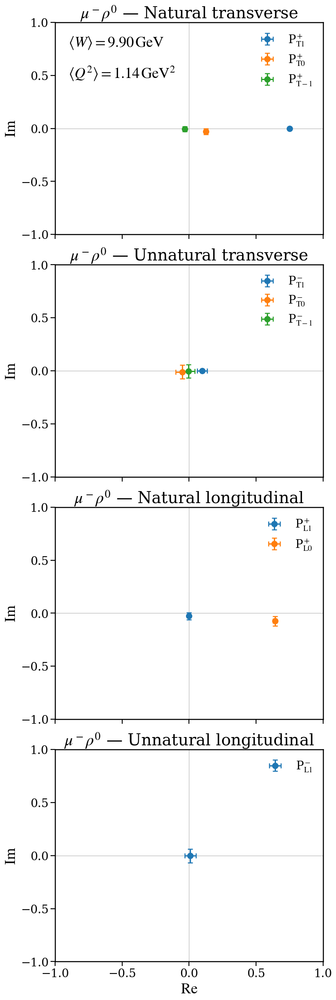

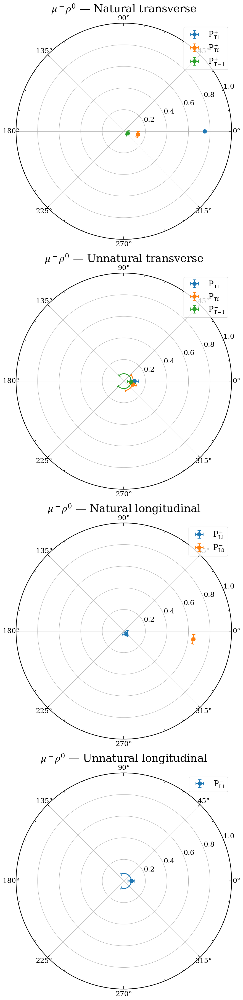

1000


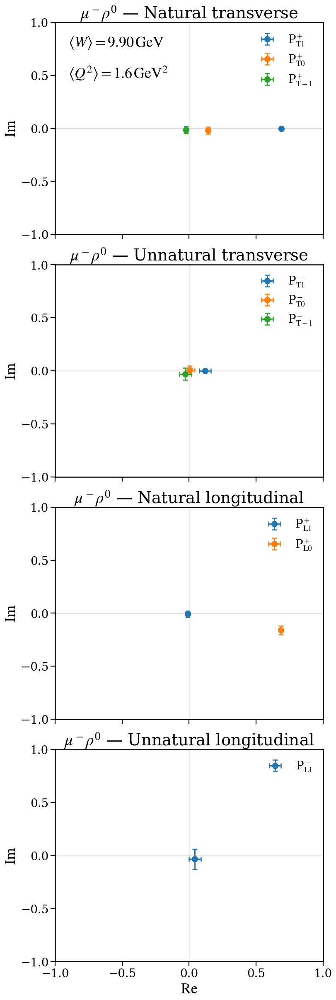

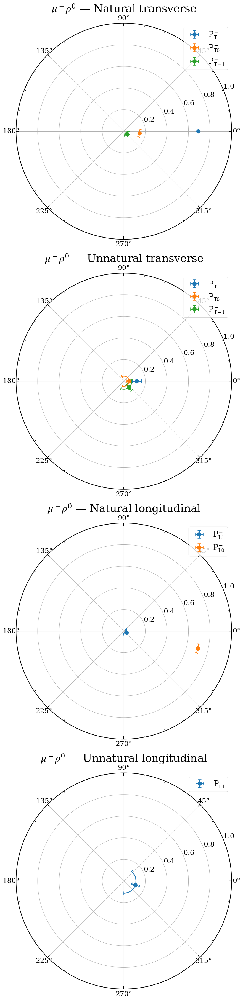

1000


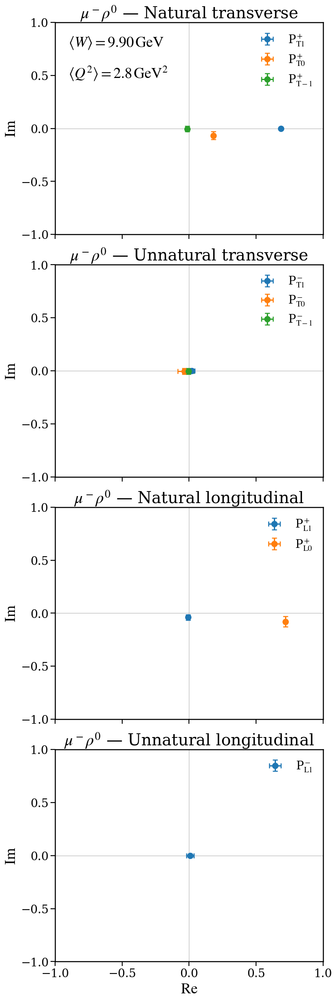

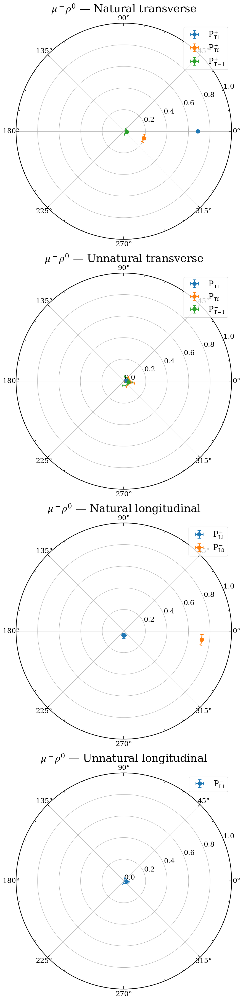

1000


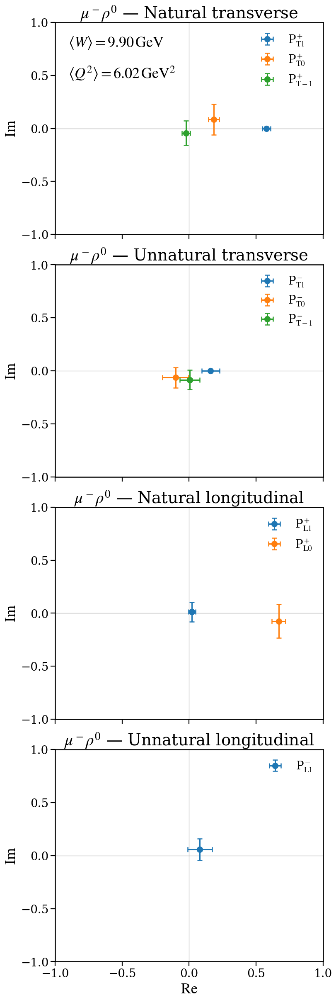

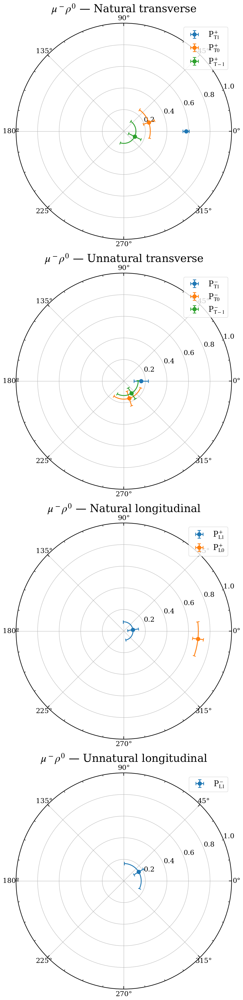

1000


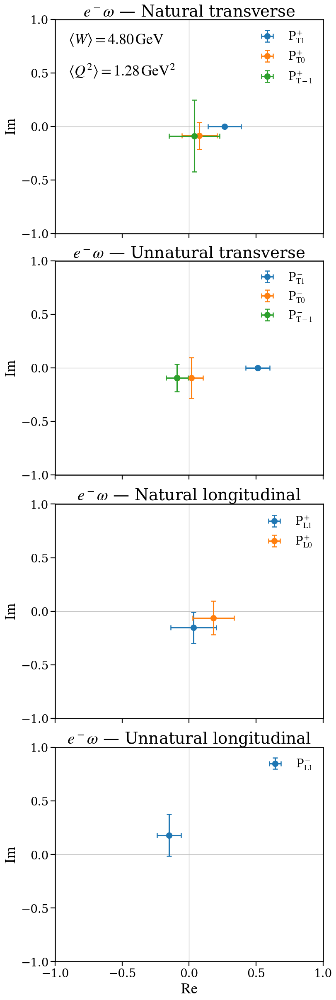

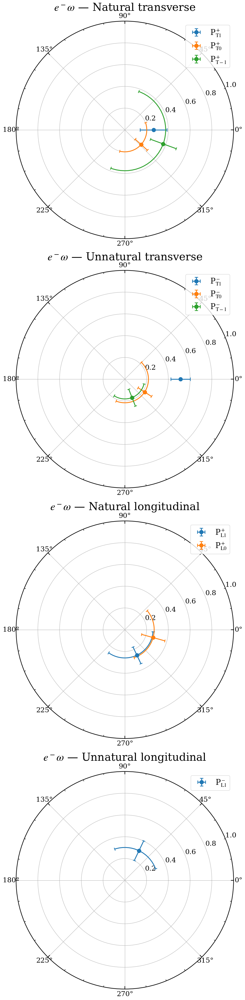

1000


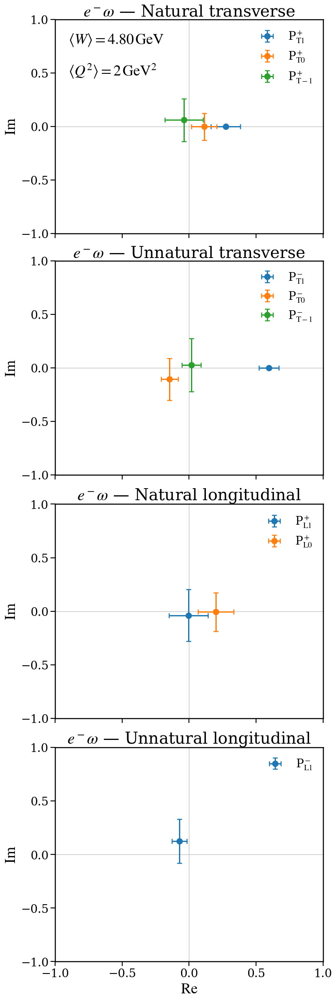

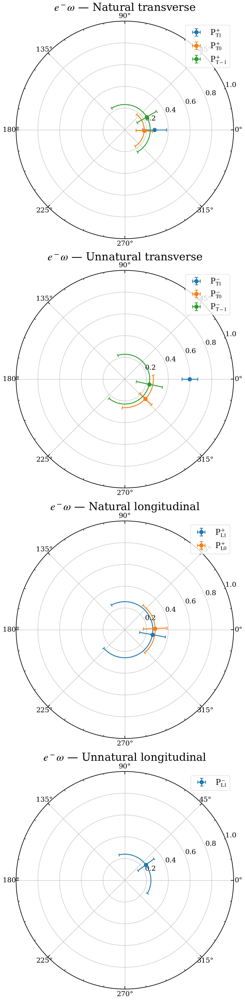

1000


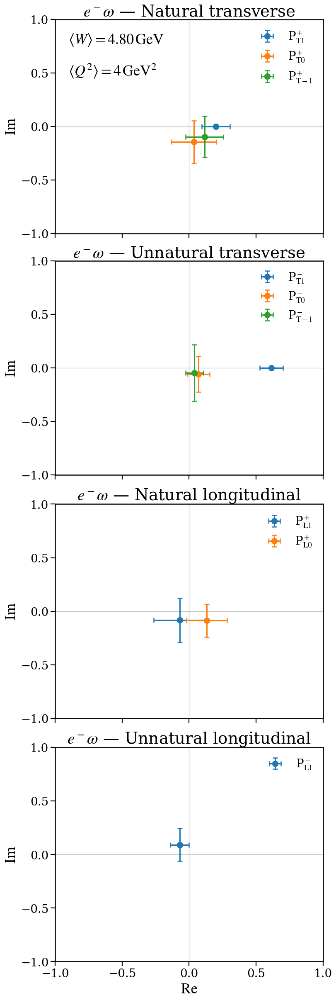

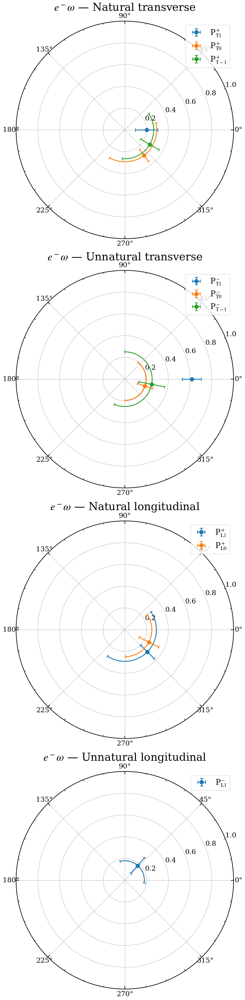

1000


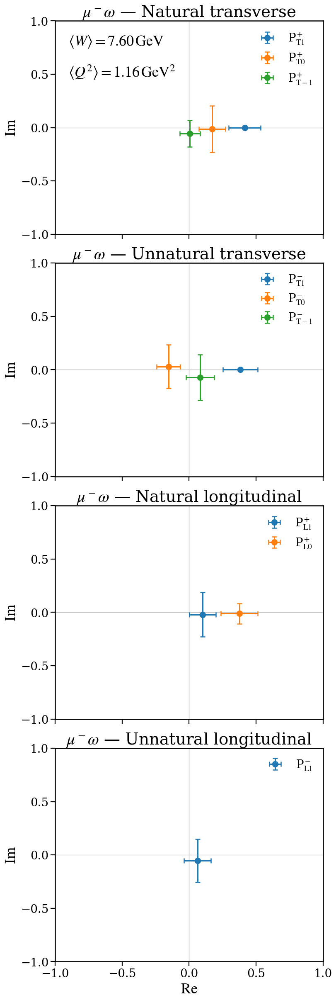

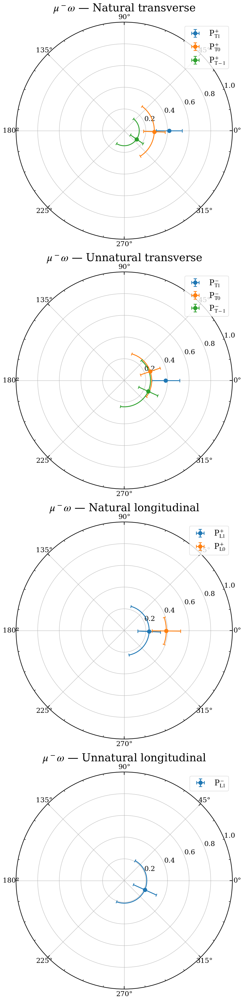

1000


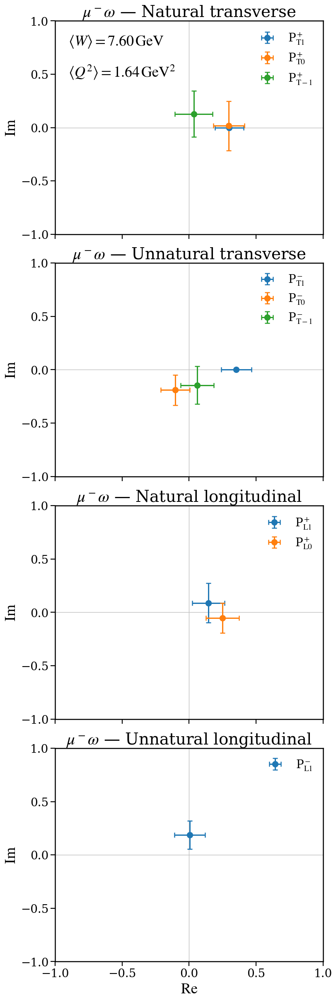

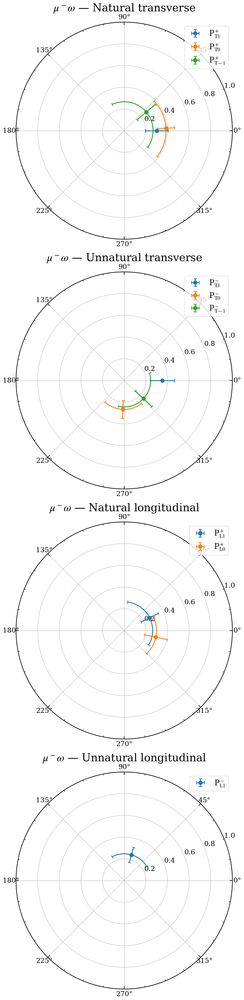

1000


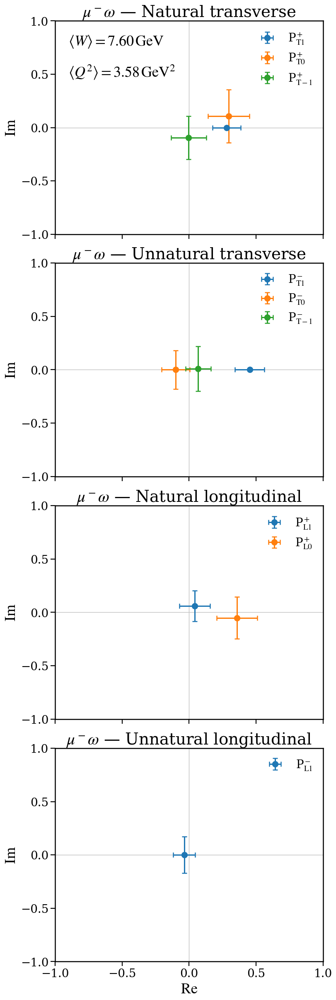

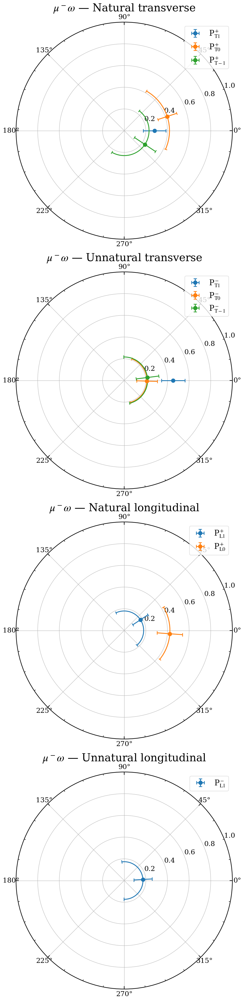

1000


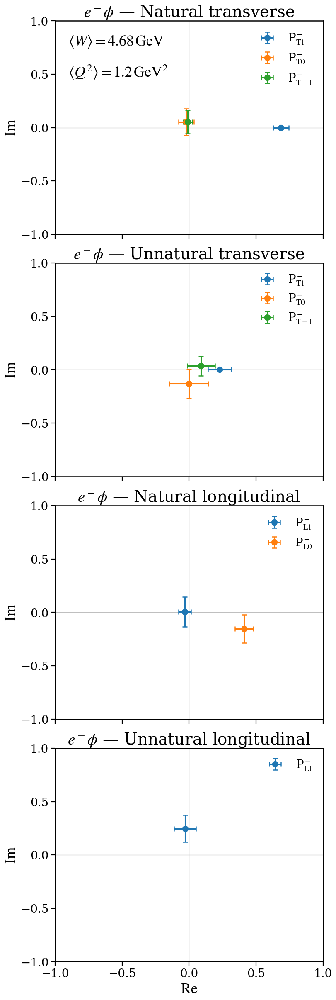

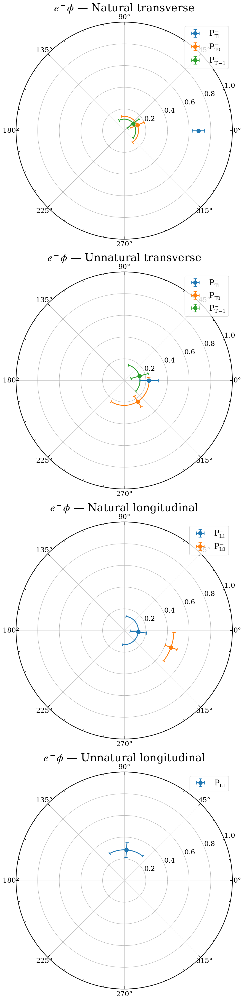

1000


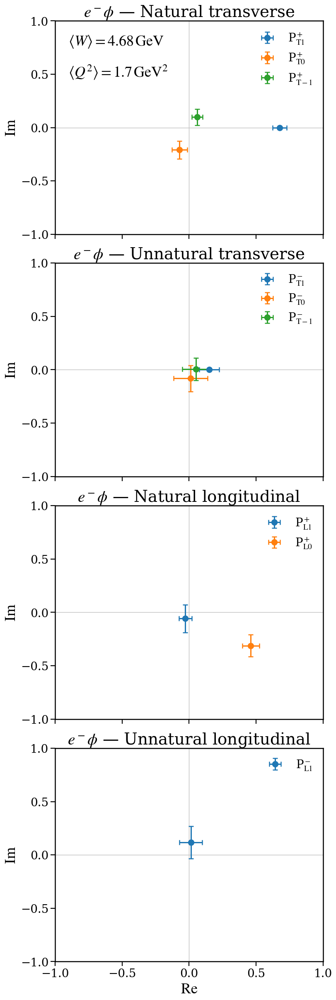

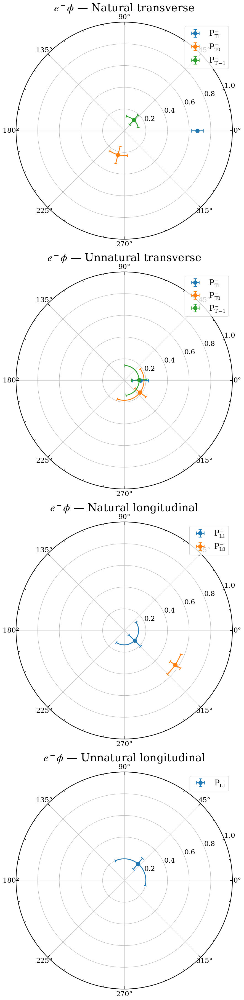

1000


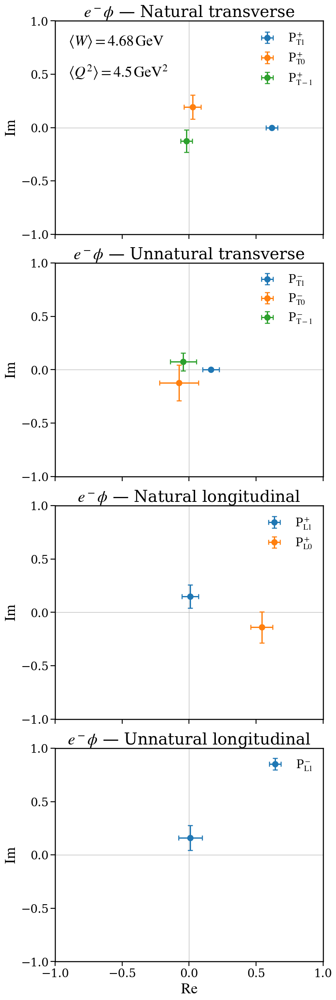

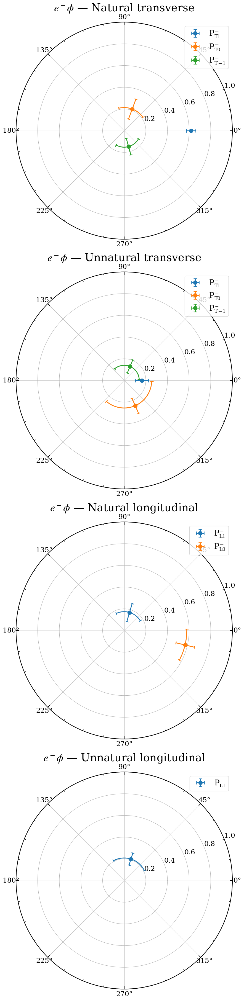

In [11]:
titles = [
    "Natural transverse", "Unnatural transverse",
    "Natural longitudinal", "Unnatural longitudinal",
]

# Bootstrap Argand summaries.  The established HERMES layout is retained.
for r, prefix in enumerate(filenames):
    with open(FIGURE_DIR / f"amps_{prefix}.txt", "w") as f:
        for i, q2 in enumerate(Q2[r]):
            print(f"Q2 = {q2}", file=f)
            df = ROOT.RDataFrame("PartialWaves", str(output_file(prefix, "bootstrap", i)))
            df = df.Define("a_L_1_m1", "-1*a_L_1_1")
            df = df.Define("b_L_1_m1", "b_L_1_1")
            df = df.Define("aphi_L_1_m1", "aphi_L_1_1")
            df = df.Define("bphi_L_1_m1", "bphi_L_1_1")

            log_val = df.AsNumpy(columns=["log_val"])["log_val"]
            arrays_mag = df.AsNumpy(columns=cols_mag)
            arrays_phase = df.AsNumpy(columns=cols_phase)
            order = np.argsort(log_val)[:1000]
            arrays_mag = {name: values[order] for name, values in arrays_mag.items()}
            arrays_phase = {name: values[order] for name, values in arrays_phase.items()}

            N = len(arrays_mag[cols_mag[0]])
            print(N)
            fig, axs = plt.subplots(4, 1, figsize=(8, 24), sharex=True, constrained_layout=True)
            fig2, axs2 = plt.subplots(4, 1, figsize=(12, 36), sharex=True, subplot_kw={"projection": "polar"}, constrained_layout=True)
            axs[0].text(
                0.05, 0.80,
                rf"$\langle Q^2\rangle={q2:g}\,\mathrm{{GeV}}^2$",
                fontsize=26, va="top", transform=axs[0].transAxes,
            )
            axs[0].text(
                0.05, 0.94,
                rf"$\langle W\rangle={W[r]:.2f}\,\mathrm{{GeV}}$",
                fontsize=26, va="top", transform=axs[0].transAxes,
            )
            # axs2[0].text(
            #     0.05, 0.80,
            #     rf"$\langle Q^2\rangle={q2:g}\,\mathrm{{GeV}}^2$",
            #     fontsize=26, va="top", transform=axs[0].transAxes,
            # )
            # axs2[0].text(
            #     0.05, 0.94,
            #     rf"$\langle W\rangle={W[r]:.2f}\,\mathrm{{GeV}}$",
            #     fontsize=26, va="top", transform=axs[0].transAxes,
            # )

            for j in range(4):
                for k in range(3):
                    mag_branch = cols_mag[k + 4 * j]
                    phase_branch = cols_phase[k + 4 * j]
                    if ((mag_branch[0] == "b" and mag_branch[2] == "L" and mag_branch[-1] == "0")
                            or (mag_branch[2] == "L" and mag_branch[-2] == "m")):
                        continue

                    magnitude = arrays_mag[mag_branch]
                    phase = arrays_phase[phase_branch]
                    amplitude = magnitude * np.exp(1j * phase)
                    axs[j].errorbar(
                        np.mean(amplitude.real), np.mean(amplitude.imag),
                        xerr=np.std(amplitude.real), yerr=np.std(amplitude.imag),
                        fmt="o", markersize=10, elinewidth=2.2,
                        capsize=4, capthick=1.8, color=COLORS[k],
                        label=ToWave(mag_branch),
                    )

                    axs2[j].errorbar(
                        np.mean(phase), circular_mean(magnitude),
                        xerr=circular_std(phase), yerr=np.std(magnitude),
                        fmt="o", markersize=10, elinewidth=2.2,
                        capsize=4, capthick=1.8, color=COLORS[k],
                        label=ToWave(mag_branch),
                    )

                axs[j].set_xlim(-1, 1)
                axs[j].set_ylim(-1, 1)
                axs[j].set_title(channel_titles[r] + " — " + titles[j])
                axs[j].set_ylabel(r"$\operatorname{Im}$")
                axs[j].set_yticks([-1, -0.5, 0, 0.5, 1])
                axs[j].set_xticks([-1, -0.5, 0, 0.5, 1])
                axs[j].axhline(0, color="0.75", lw=1, zorder=0)
                axs[j].axvline(0, color="0.75", lw=1, zorder=0)
                axs[j].legend(loc="upper right", frameon=False, fontsize=20)

                axs2[j].set_rmax(1)
                axs2[j].set_title(channel_titles[r] + " — " + titles[j])
                axs2[j].grid(True)
                #axs2[j].set_ylabel(r"Magnitude")
                #axs2[j].axhline(0, color="0.75", lw=1, zorder=0)
                #axs2[j].axvline(0, color="0.75", lw=1, zorder=0)
                axs2[j].legend(loc="best", frameon=True, fontsize=20)
                apply_poster_axis_style(axs2[j], labelsize=18)

            axs[-1].set_xlabel(r"$\operatorname{Re}$")
            output = FIGURE_DIR / f"{reaction[r]}_bootstrap_{i}_poster.pdf"
            fig.savefig(output, transparent=True, bbox_inches="tight")
            output2 = FIGURE_DIR / f"{reaction[r]}_bootstrap_mag_{i}_poster.pdf"
            fig2.savefig(output2, transparent=True, bbox_inches="tight")
            plt.show()


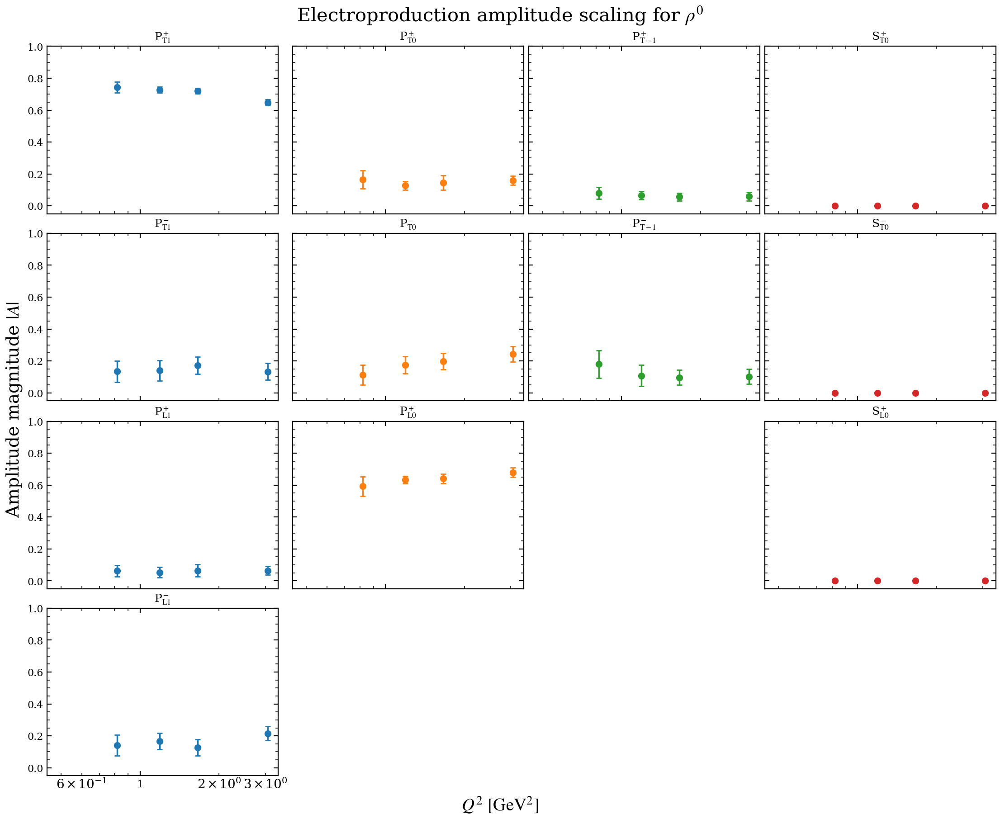

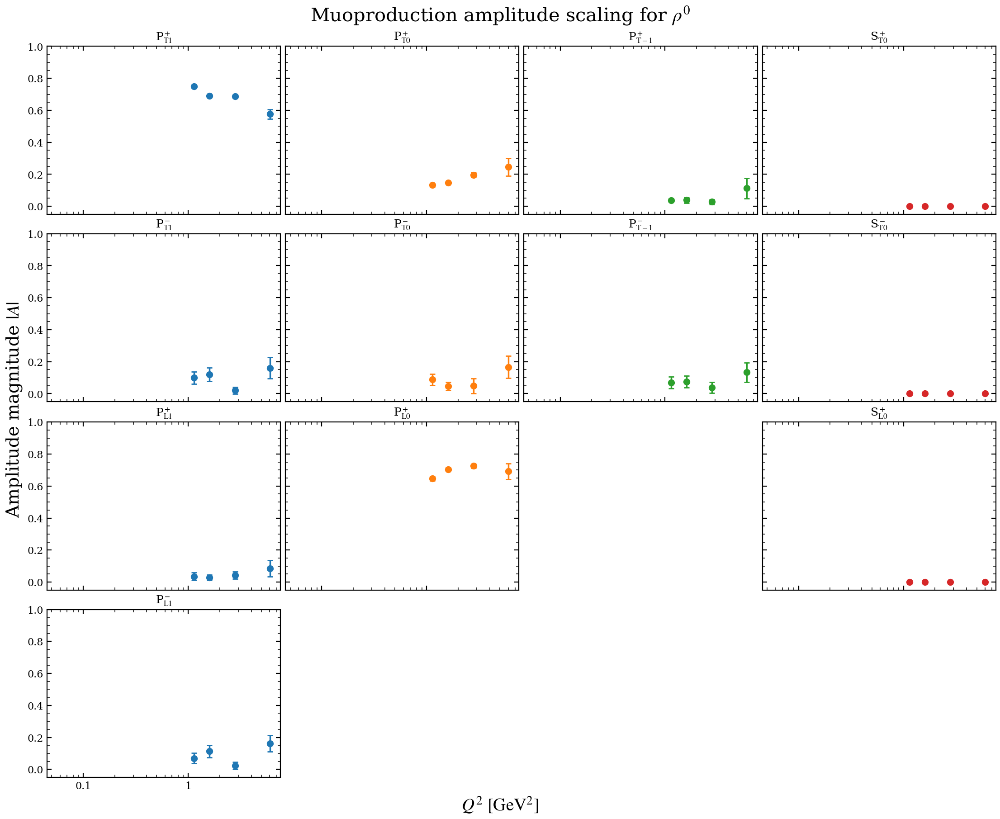

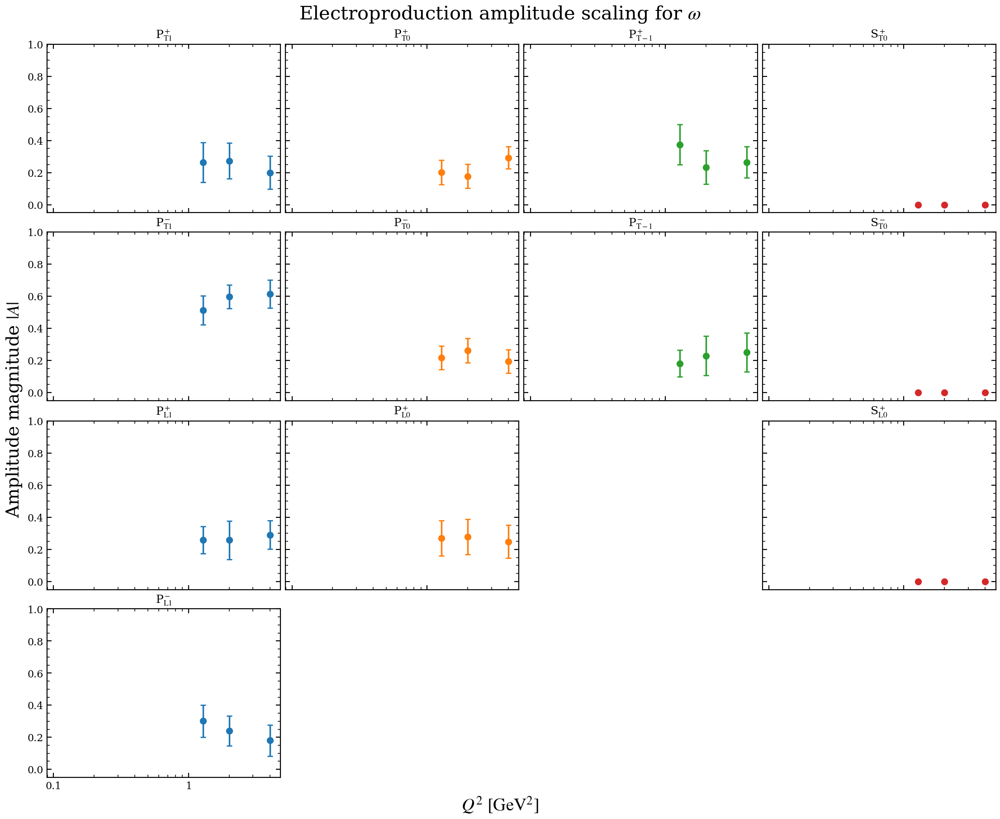

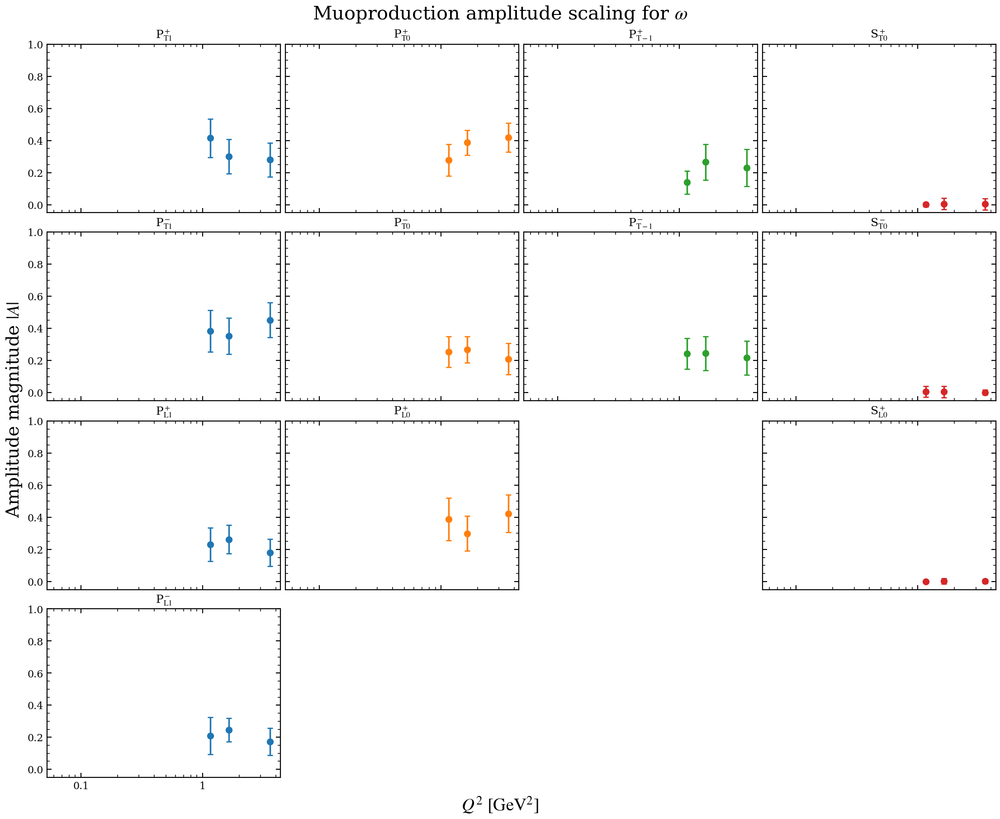

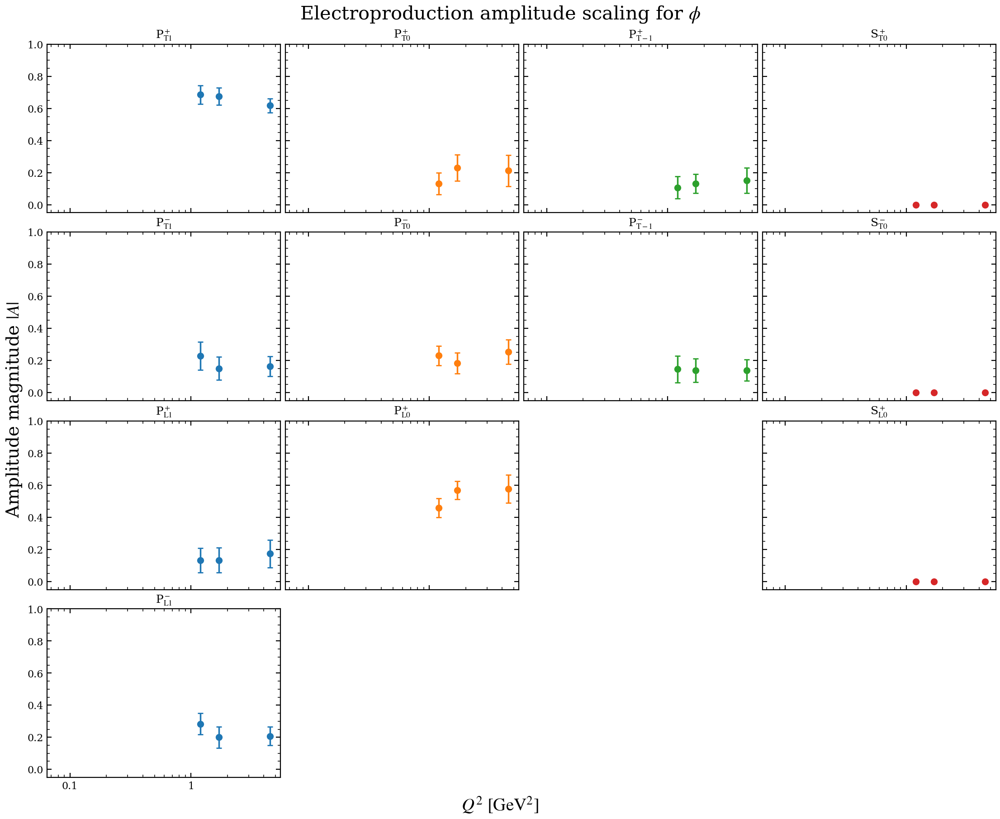

In [7]:
# AMPLITUDE SCALING USING BOOTSTRAP TO GET UNCERTAINTIES
# The established HERMES panel design is intentionally retained.
scaling_titles = [
    r"Electroproduction amplitude scaling for $\rho^0$",
    r"Muoproduction amplitude scaling for $\rho^0$",
    r"Electroproduction amplitude scaling for $\omega$",
    r"Muoproduction amplitude scaling for $\omega$",
    r"Electroproduction amplitude scaling for $\phi$",
]

for r, prefix in enumerate(filenames):
    mags_array = np.full((bin_size[r], 4, 4), np.nan)
    phases_array = np.full((bin_size[r], 4, 4), np.nan)
    mags_array_err = np.full((bin_size[r], 4, 4), np.nan)
    phases_array_err = np.full((bin_size[r], 4, 4), np.nan)

    for i, q2 in enumerate(Q2[r]):
        df = ROOT.RDataFrame("PartialWaves", str(output_file(prefix, "bootstrap", i)))
        df = df.Define("a_L_1_m1", "-1*a_L_1_1")
        df = df.Define("b_L_1_m1", "b_L_1_1")
        df = df.Define("aphi_L_1_m1", "aphi_L_1_1")
        df = df.Define("bphi_L_1_m1", "bphi_L_1_1")
        mags = df.AsNumpy(columns=cols_mag)
        phases = df.AsNumpy(columns=cols_phase)

        for j in range(4):
            for k in range(4):
                branch = cols_mag[k + 4 * j]
                if ((branch[0] == "b" and branch[2] == "L" and branch[-1] == "0")
                        or (branch[2] == "L" and branch[-2] == "m")):
                    continue
                magnitude = mags[branch]
                phase = phases[cols_phase[k + 4 * j]]
                mags_array[i, j, k] = np.mean(magnitude)
                phases_array[i, j, k] = circular_mean(phase)
                mags_array_err[i, j, k] = np.std(magnitude)
                phases_array_err[i, j, k] = circular_std(phase)

    fig, axs = plt.subplots(4, 4, figsize=(22, 18), sharex=True, sharey=True, constrained_layout=True)

    for j in range(4):
        for k in range(4):
            branch = cols_mag[k + 4 * j]
            if ((branch[0] == "b" and branch[2] == "L" and branch[-1] == "0")
                    or (branch[2] == "L" and branch[-2] == "m")):
                axs[j, k].set_visible(False)
                continue

            axs[j, k].errorbar(
                Q2[r], mags_array[:, j, k], yerr=mags_array_err[:, j, k],
                fmt="o", markersize=10, elinewidth=2.5,
                capsize=4, capthick=2.0, color=COLORS[k],
            )
            axs[j, k].set_ylim(-0.05, 1.0)
            if len(Q2[r]) > 1:
                axs[j, k].set_xscale("log")
            axs[j, k].xaxis.set_major_formatter(mpl.ticker.StrMethodFormatter("{x:g}"))
            axs[j, k].set_title(ToWave(branch), fontsize=18, pad=10)
            apply_poster_axis_style(axs[j, k], labelsize=16)

    fig.suptitle(scaling_titles[r], fontsize=30)
    fig.supylabel(r"Amplitude magnitude $|A|$", fontsize=28)
    fig.supxlabel(r"$Q^2\ [\mathrm{GeV}^2]$", fontsize=28)
    output = FIGURE_DIR / f"{reaction[r]}_scaling_poster.png"
    fig.savefig(output, bbox_inches="tight")
    plt.show()
